In [8]:
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models
import torch.nn as nn
from torchvision import transforms
from sklearn.model_selection import train_test_split
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms.functional as TF


# 1. Custom Dataset Class for LGG MRI Segmentation

class LGGDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.image_files = []
        self.mask_files = []
        
        # Collect image and mask file paths
        for patient_folder in os.listdir(root_dir):
            patient_image_folder = os.path.join(root_dir, patient_folder)
            
            if os.path.isdir(patient_image_folder):
                image_files = sorted([f for f in os.listdir(patient_image_folder) if f.endswith('.tif') and '_mask' not in f])
                mask_files = sorted([f for f in os.listdir(patient_image_folder) if '_mask' in f])
                
                for img, mask in zip(image_files, mask_files):
                    self.image_files.append(os.path.join(patient_image_folder, img))
                    self.mask_files.append(os.path.join(patient_image_folder, mask))
        
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load the MRI image and mask
        image = Image.open(self.image_files[idx])
        mask = Image.open(self.mask_files[idx])
        
        # Apply transformation if any
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        
        return image, mask

# 2. Model: UNet-VGG16 with Pretrained VGG16 as Encoder

class UNetVGG16(nn.Module):
    def __init__(self, pretrained=True):
        super(UNetVGG16, self).__init__()
        
        # Load pre-trained VGG16 model
        vgg16 = models.vgg16(pretrained=pretrained)
        
        # Use only the feature extraction part of VGG16
        self.encoder = vgg16.features
        
        # Decoder: series of upsampling layers with convolution blocks
        self.decoder1 = self._conv_block(1024, 256)
        self.decoder2 = self._conv_block(512, 128)
        self.decoder3 = self._conv_block(256, 64)
        self.decoder4 = self._conv_block(128, 32)
        self.decoder5 = self._conv_block(32, 16)
        
        # Final output layer (1 channel for binary segmentation)
        self.final_conv = nn.Conv2d(16, 1, kernel_size=1)
        
        # Upsampling operation (bilinear interpolation)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def _conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            # nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            # nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder path
        enc1 = self.encoder[0:4](x)
        enc2 = self.encoder[4:9](enc1)
        enc3 = self.encoder[9:16](enc2)
        enc4 = self.encoder[16:23](enc3)
        enc5 = self.encoder[23:30](enc4)
        
        # Decoder path with skip connections
        dec1 = self.upsample(enc5)
        # print(dec1.size())
        dec1 = torch.cat([dec1, enc4], dim=1)
        # print(dec1.size(), enc4.size())
        dec1 = self.decoder1(dec1)
        # print(dec1.size(), enc4.size())
        
        dec2 = self.upsample(dec1)
        dec2 = torch.cat([dec2, enc3], dim=1)
        dec2 = self.decoder2(dec2)
        
        dec3 = self.upsample(dec2)
        dec3 = torch.cat([dec3, enc2], dim=1)
        dec3 = self.decoder3(dec3)
        
        dec4 = self.upsample(dec3)
        dec4 = torch.cat([dec4, enc1], dim=1)
        dec4 = self.decoder4(dec4)
        
        dec5 = self.upsample(dec4)
        dec5 = self.decoder5(dec5)
        
        # Final output layer
        out = self.final_conv(dec5)
        
        return out

# 3. Data Augmentation and Preprocessing

data_transforms = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to 256x256
    transforms.RandomRotation(degrees=10),  # Random rotation for augmentation
    transforms.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.2)),  # Random scaling (zoom)
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),  # Convert images to PyTorch tensors
])

# 4. Data Splitting (80-10-10)

root_dir = '/kaggle/input/lgg-mri-segmentation/kaggle_3m'  # Set the correct path

# Initialize the dataset with transformations
dataset = LGGDataset(root_dir=root_dir, transform=data_transforms)

# Split the dataset into 80% training, 10% validation, and 10% testing
train_files, test_files = train_test_split(dataset.image_files, test_size=0.2, random_state=42)
val_files, test_files = train_test_split(test_files, test_size=0.5, random_state=42)

# Create DataLoader for train, validation, and test sets
train_dataset = LGGDataset(root_dir=root_dir, transform=data_transforms)
val_dataset = LGGDataset(root_dir=root_dir, transform=data_transforms)
test_dataset = LGGDataset(root_dir=root_dir, transform=data_transforms)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Report the number of images in each set
print(f"Training set: {len(train_files)} images")
print(f"Validation set: {len(val_files)} images")
print(f"Test set: {len(test_files)} images")

# 5. Dice Loss and Metrics Functions

def dice_coefficient(y_true, y_pred):    
    smooth = 1e-6
    intersection = torch.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (torch.sum(y_true) + torch.sum(y_pred) + smooth)

def iou_score(y_true, y_pred):
    
    smooth = 1e-6
    intersection = torch.sum(y_true * y_pred)
    union = torch.sum(y_true) + torch.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)



Training set: 3143 images
Validation set: 393 images
Test set: 393 images


In [9]:
import random

def visualize_images(dataset, num_samples=10):
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))
    fig.suptitle("Original Images, Masks, and Augmented Images", fontsize=16, y=0.93)
    
    for i in range(num_samples):
        # Randomly select an image
        idx = random.randint(0, len(dataset) - 1)
        
        # Get the original image and mask
        image, mask = dataset[idx]
        
        # Apply augmentation
        augmented_image = apply_augmentation(image)
        
        # Convert tensors to PIL for visualization
        image_pil = TF.to_pil_image(image)
        mask_pil = TF.to_pil_image(mask)
        augmented_pil = TF.to_pil_image(augmented_image)
        
        # Plot original image
        axes[i, 0].imshow(image_pil, cmap='gray')
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")
        
        # Plot corresponding mask
        axes[i, 1].imshow(mask_pil, cmap='gray')
        axes[i, 1].set_title("Mask")
        axes[i, 1].axis("off")
        
        # Plot augmented image
        axes[i, 2].imshow(augmented_pil, cmap='gray')
        axes[i, 2].set_title("Augmented Image")
        axes[i, 2].axis("off")
    
    plt.tight_layout()
    plt.show()

def apply_augmentation(image):
    data_transforms = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize images to 256x256
        transforms.RandomRotation(degrees=30),  # Random rotation for augmentation
        transforms.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.2)),  # Random scaling (zoom)
        transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Random brightness and contrast adjustment
        # transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        # transforms.ToTensor(),  # Convert images to PyTorch tensors
    ])
    return data_transforms(image)


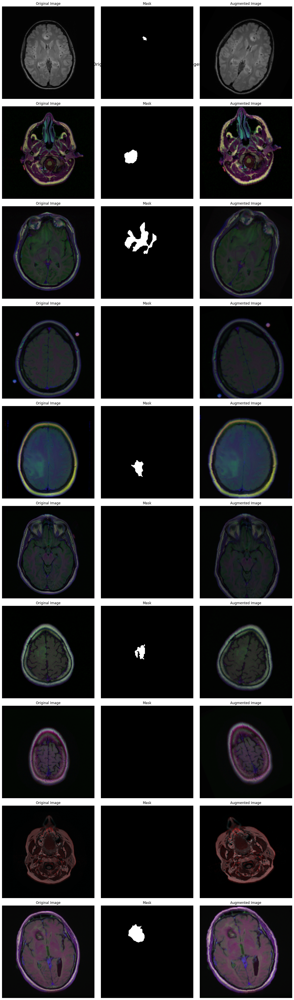

In [10]:
# Assuming train_dataset is already created
visualize_images(train_dataset, num_samples=10)


In [11]:
def dice_coefficient(y_true, y_pred, threshold=0.5, eps=1e-6):
    y_pred = (y_pred > threshold).float()
    intersection = torch.sum(y_true * y_pred)
    union = torch.sum(y_true) + torch.sum(y_pred)
    dice = (2.0 * intersection + eps) / (union + eps)
    return dice

def iou_score(y_true, y_pred, threshold=0.5, eps=1e-6):
    y_pred = (y_pred > threshold).float()
    intersection = torch.sum(y_true * y_pred)
    union = torch.sum(y_true) + torch.sum(y_pred) - intersection
    iou = (intersection + eps) / (union + eps)
    return iou

def pixel_accuracy(y_true, y_pred, threshold=0.5):
    y_pred = (y_pred > threshold).float()
    correct = torch.sum((y_true == y_pred).float())
    total = torch.numel(y_true)
    accuracy = correct / total
    return accuracy


In [12]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, y_pred, y_true):
        # Apply sigmoid to ensure predictions are probabilities
        y_pred = torch.sigmoid(y_pred)
        
        # Compute the binary cross entropy loss
        bce_loss = F.binary_cross_entropy(y_pred, y_true, reduction='none')
        
        # Compute the focal weight
        pt = torch.exp(-bce_loss)  # pt = p if y_true == 1 else 1 - p
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * bce_loss
        
        return focal_loss.mean()


In [13]:
def visualize_samples(images, true_masks, pred_masks, epoch):
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    fig.suptitle(f"Epoch {epoch} - Input Image, Ground Truth, and Prediction", fontsize=16)
    
    for i, (image, true_mask, pred_mask) in enumerate(zip(images, true_masks, pred_masks)):
        # Convert tensors to PIL images for visualization
        image_pil = TF.to_pil_image(image.cpu())
        true_mask_pil = TF.to_pil_image(true_mask.cpu())
        pred_mask_pil = TF.to_pil_image(pred_mask.cpu())
        
        # Input image
        axes[i, 0].imshow(image_pil, cmap='gray')
        axes[i, 0].set_title("Input Image")
        axes[i, 0].axis("off")
        
        # Ground truth mask
        axes[i, 1].imshow(true_mask_pil, cmap='gray')
        axes[i, 1].set_title("Ground Truth Mask")
        axes[i, 1].axis("off")
        
        # Predicted mask
        axes[i, 2].imshow(pred_mask_pil, cmap='gray')
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis("off")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 246/246 [01:41<00:00,  2.42it/s]


Epoch 1/20, Train Loss: 0.0302, Val Loss: 0.0072, Dice Coefficient: 0.1937, IoU Score: 0.1937, Accuracy: 0.9570


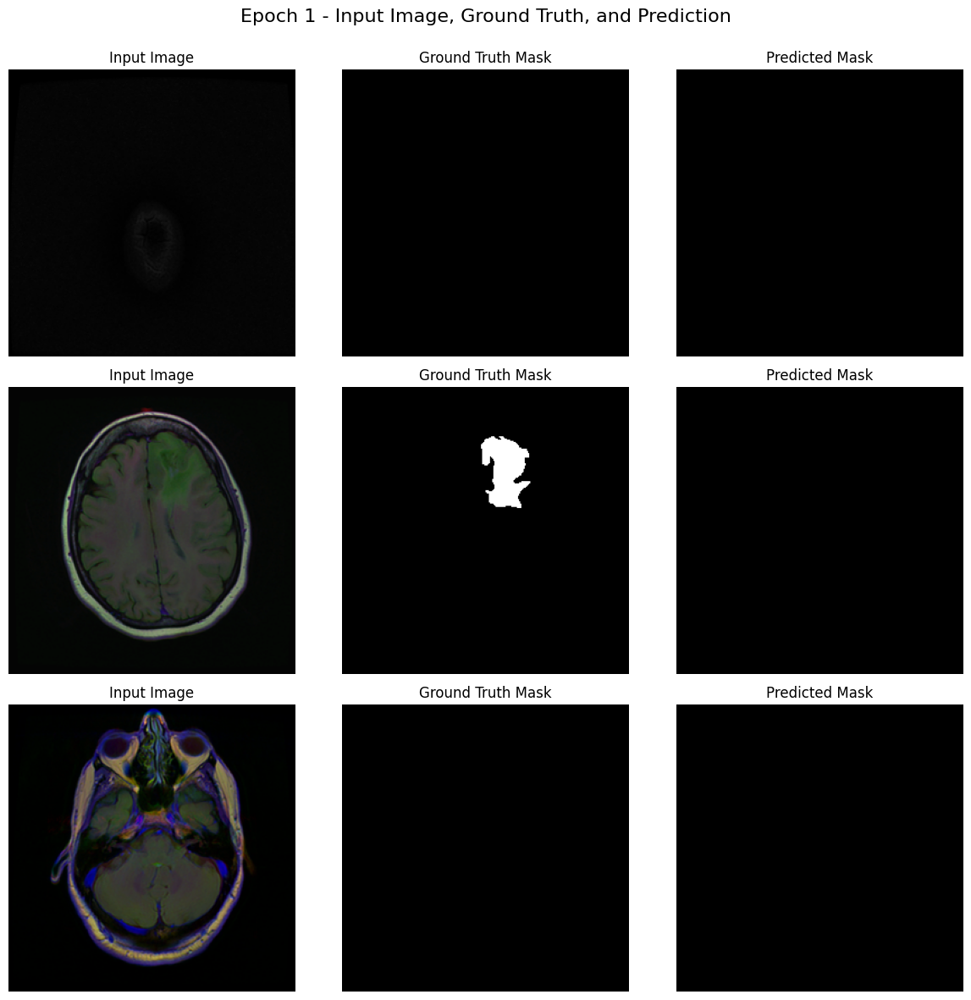

100%|██████████| 246/246 [01:40<00:00,  2.44it/s]


Epoch 2/20, Train Loss: 0.0068, Val Loss: 0.0059, Dice Coefficient: 0.1937, IoU Score: 0.1937, Accuracy: 0.9560


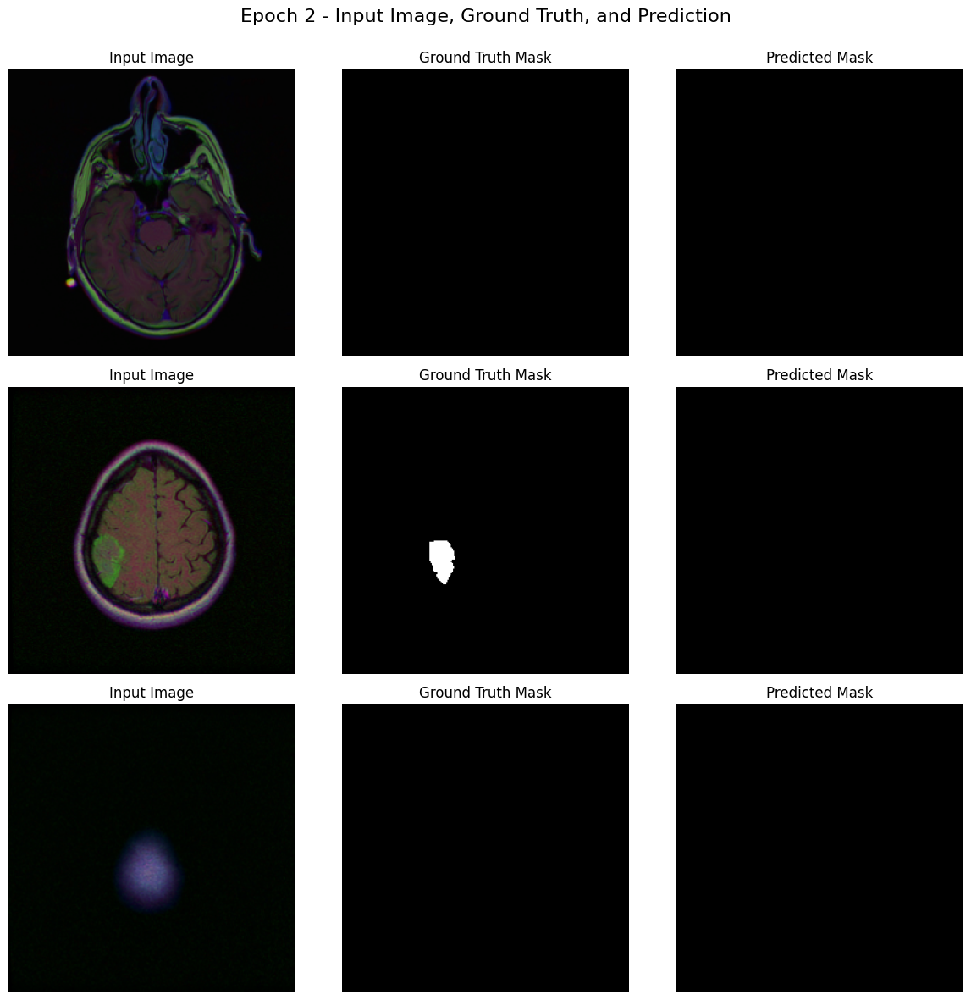

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 3/20, Train Loss: 0.0056, Val Loss: 0.0047, Dice Coefficient: 0.1978, IoU Score: 0.1958, Accuracy: 0.9539


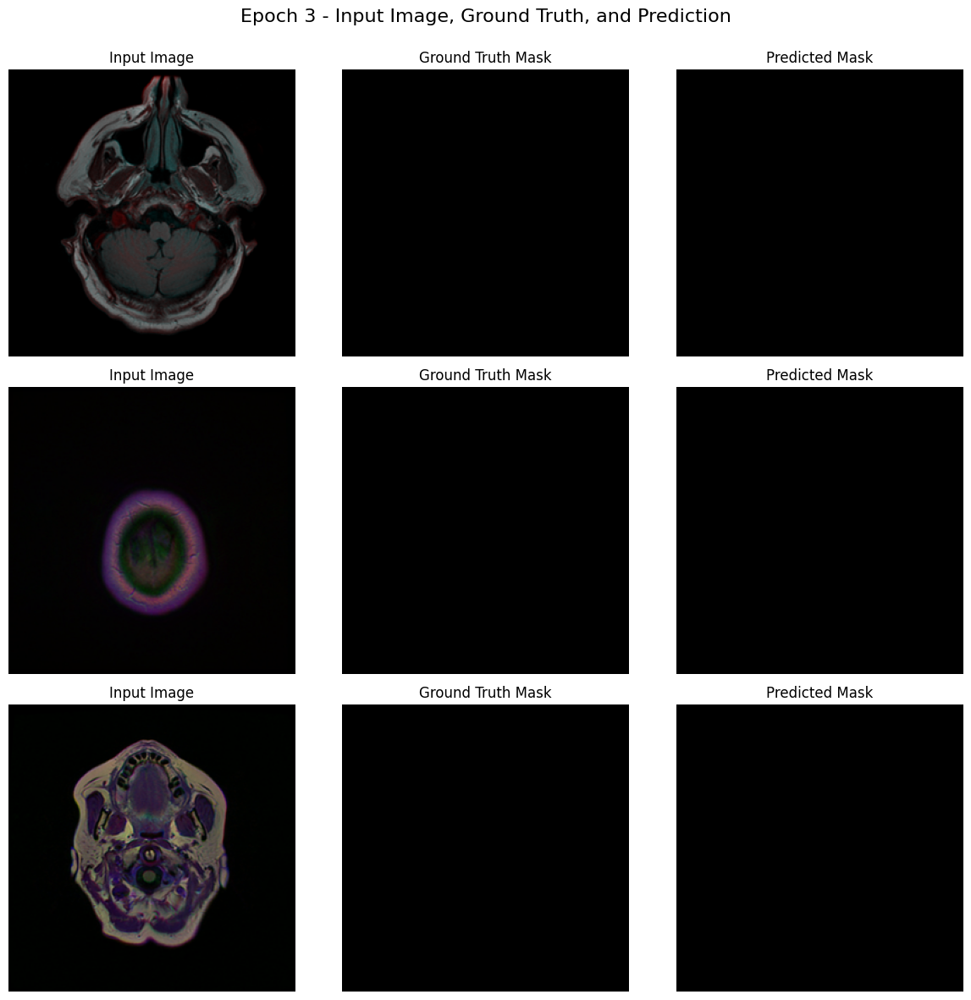

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 4/20, Train Loss: 0.0051, Val Loss: 0.0047, Dice Coefficient: 0.2080, IoU Score: 0.2016, Accuracy: 0.9554


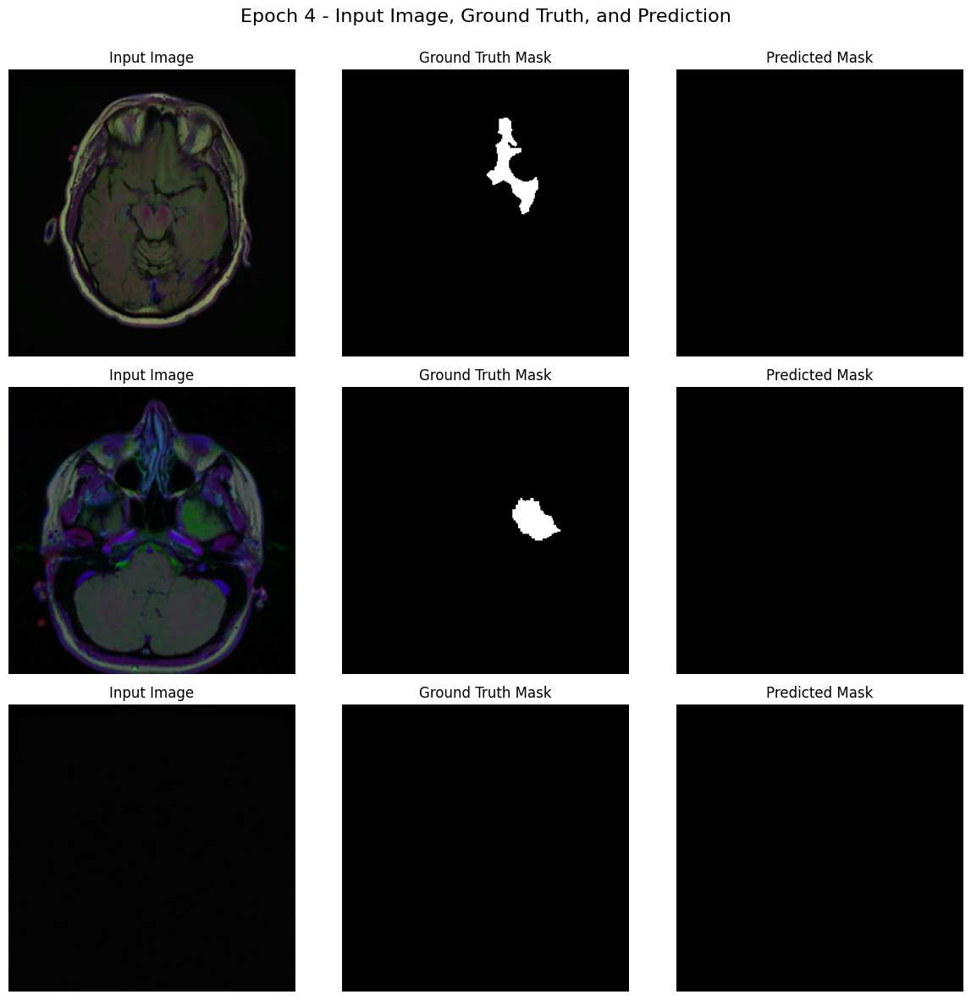

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 5/20, Train Loss: 0.0047, Val Loss: 0.0050, Dice Coefficient: 0.2792, IoU Score: 0.2456, Accuracy: 0.9554


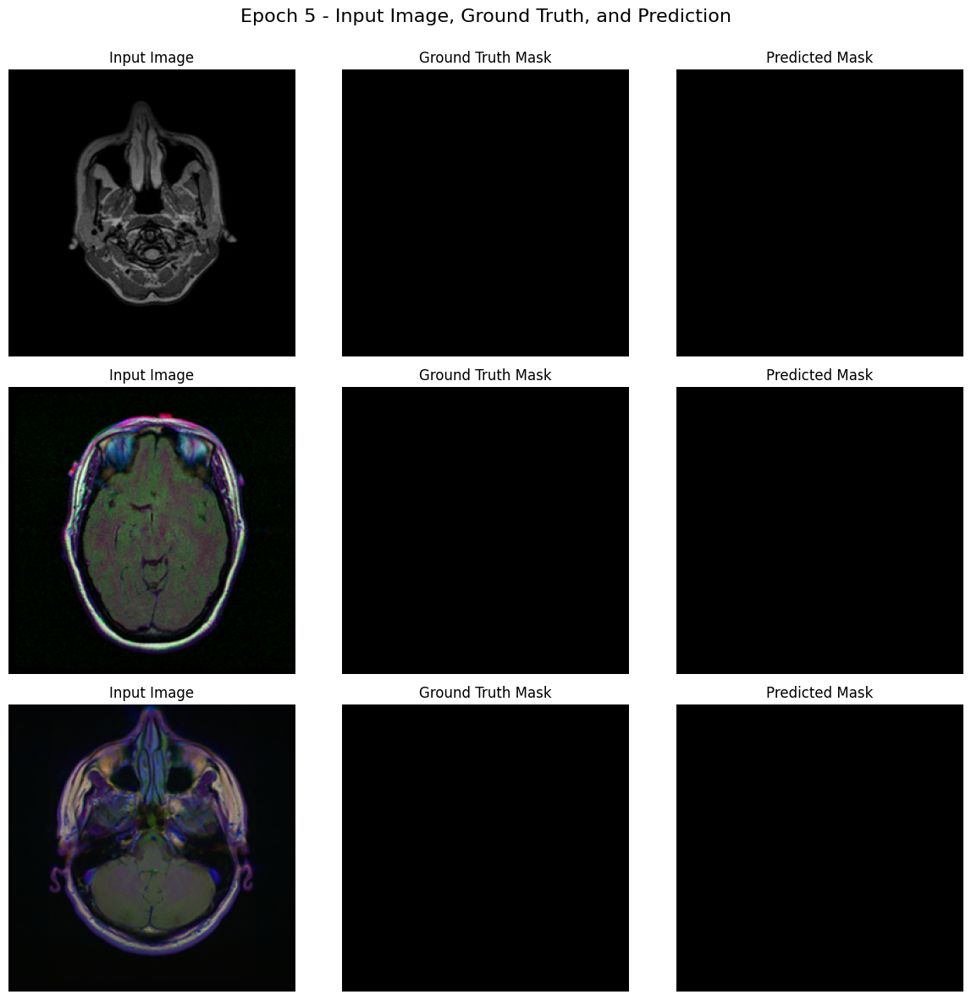

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 6/20, Train Loss: 0.0041, Val Loss: 0.0038, Dice Coefficient: 0.2996, IoU Score: 0.2587, Accuracy: 0.9501


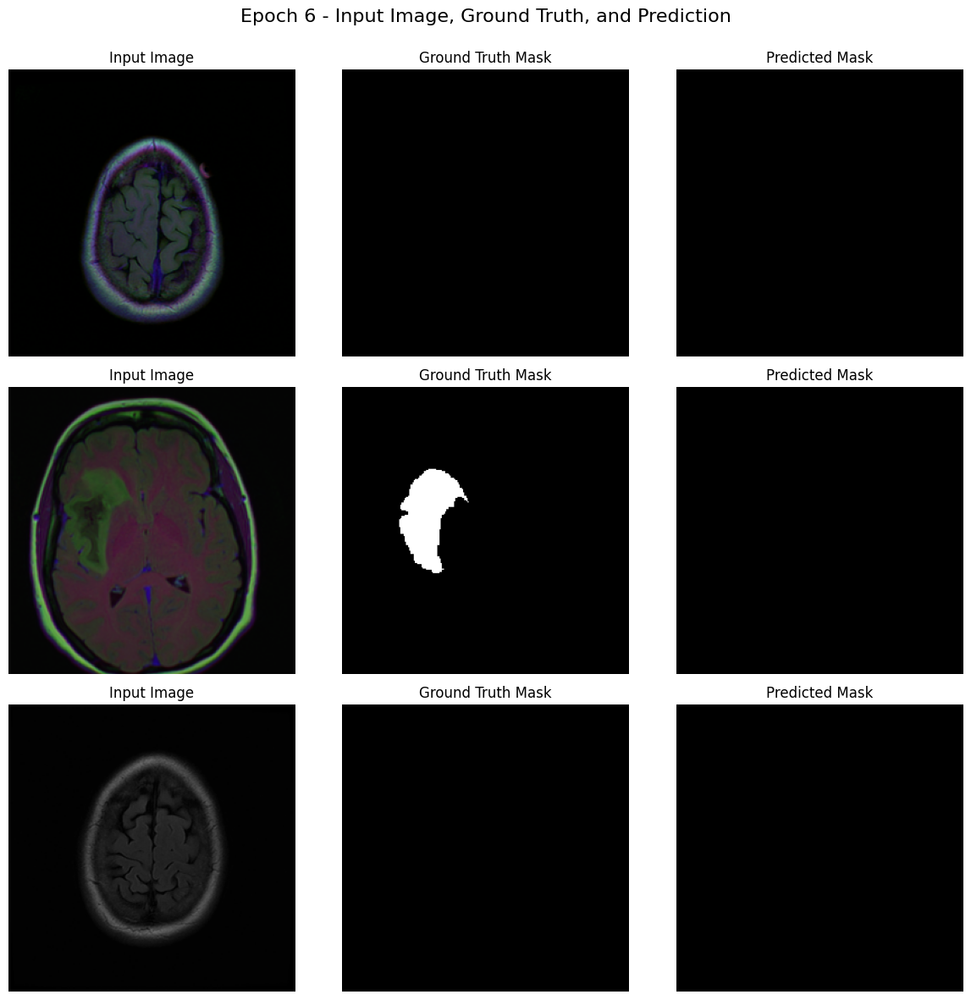

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 7/20, Train Loss: 0.0041, Val Loss: 0.0039, Dice Coefficient: 0.5289, IoU Score: 0.4275, Accuracy: 0.9547


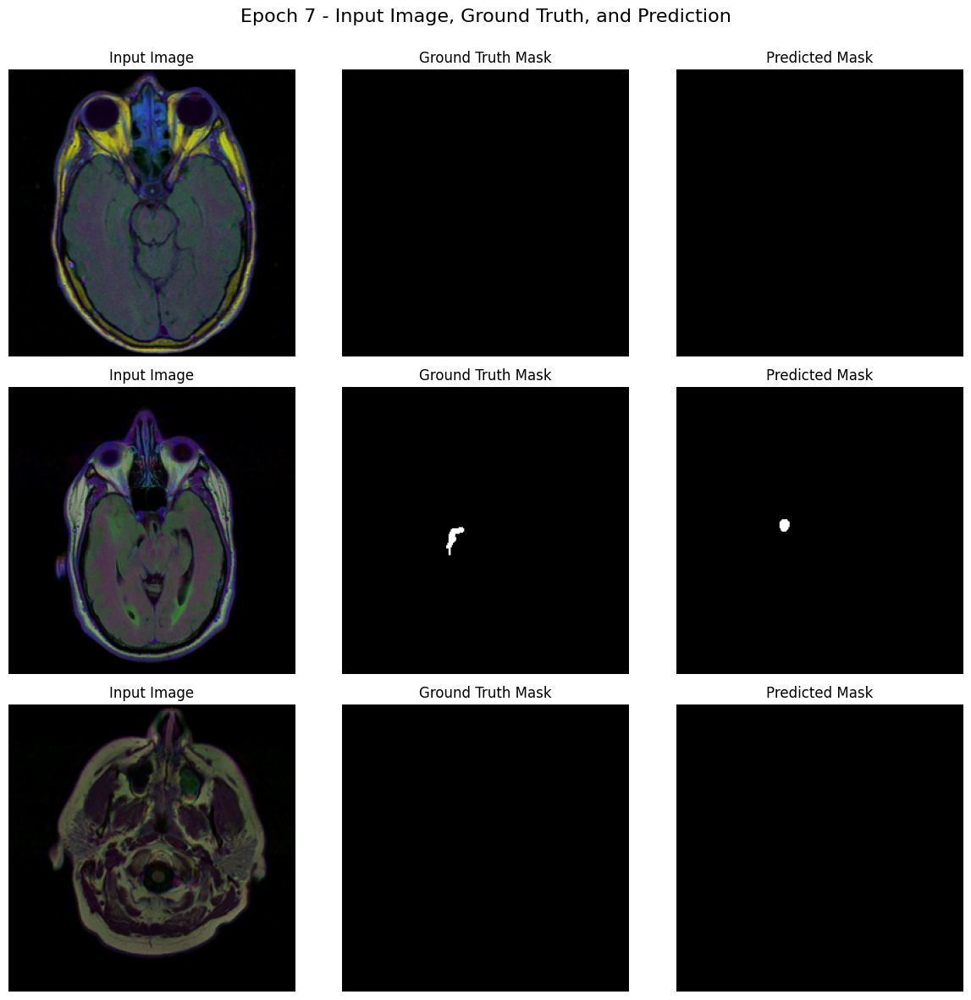

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 8/20, Train Loss: 0.0039, Val Loss: 0.0034, Dice Coefficient: 0.6001, IoU Score: 0.4839, Accuracy: 0.9551


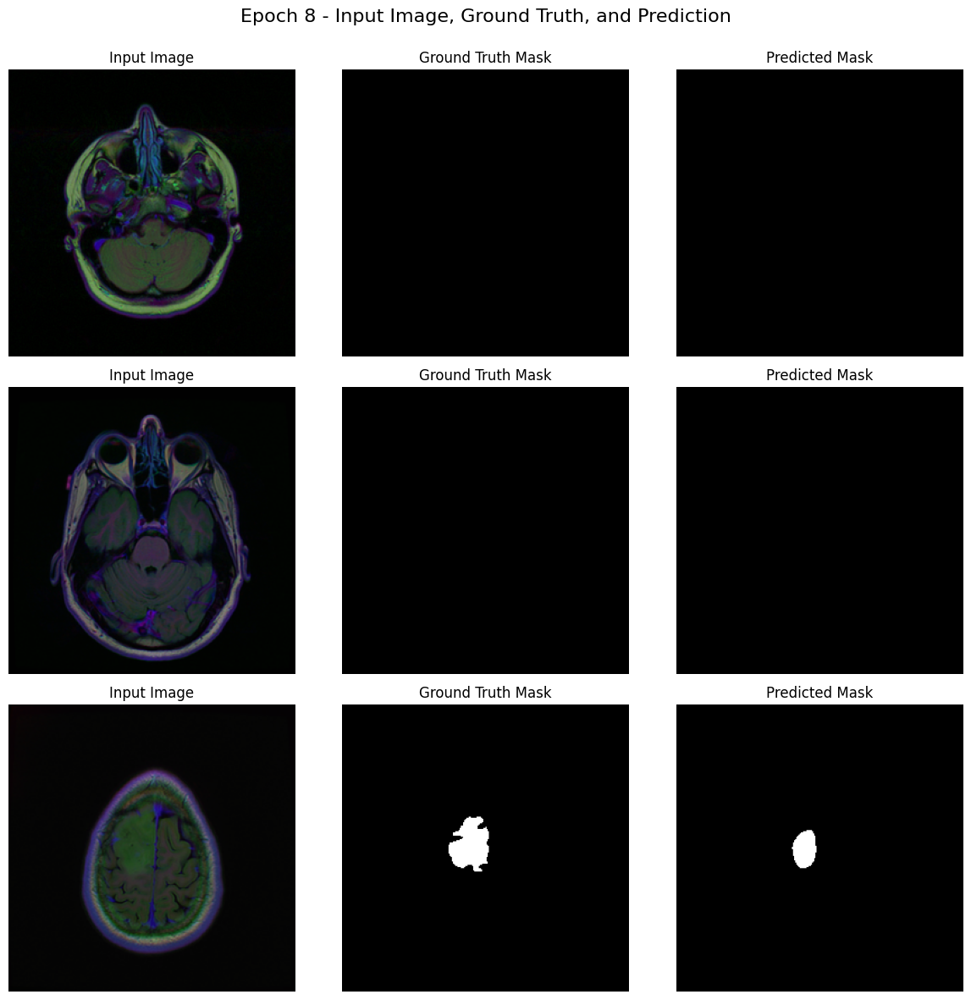

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 9/20, Train Loss: 0.0034, Val Loss: 0.0030, Dice Coefficient: 0.5266, IoU Score: 0.4256, Accuracy: 0.9573


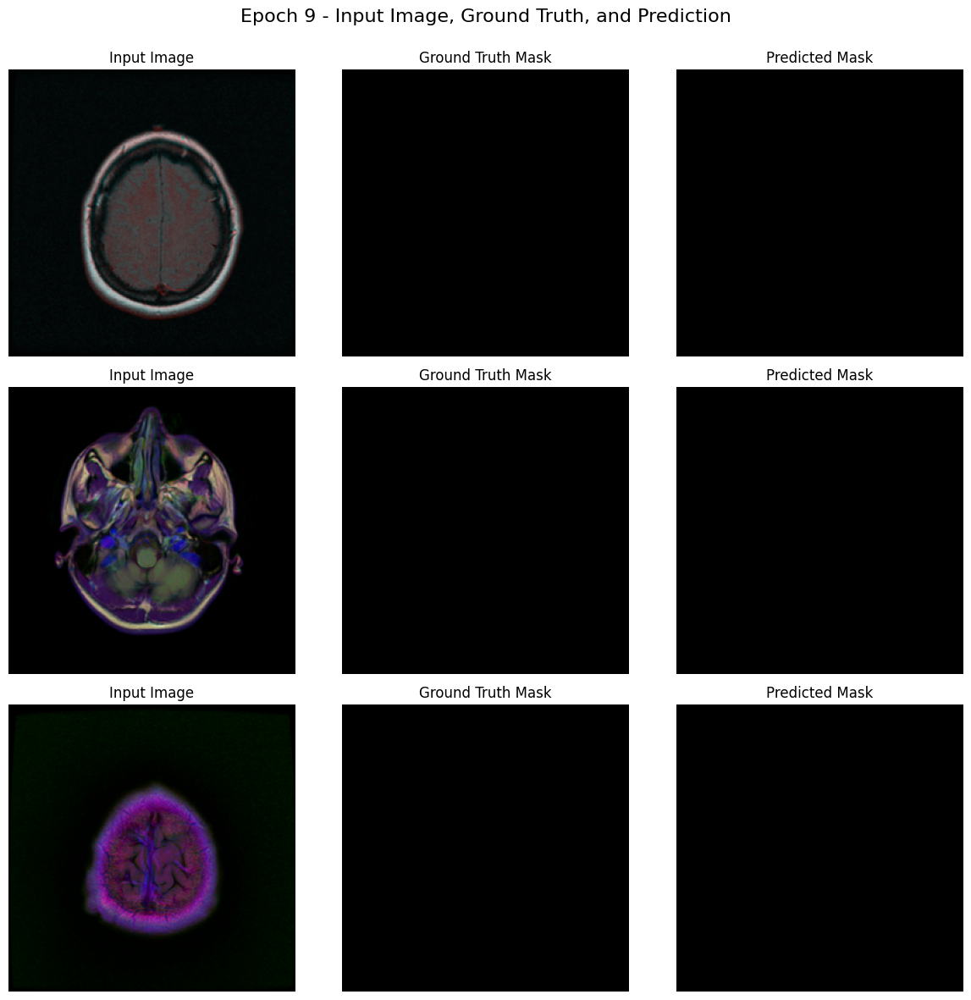

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 10/20, Train Loss: 0.0031, Val Loss: 0.0030, Dice Coefficient: 0.3321, IoU Score: 0.2795, Accuracy: 0.9526


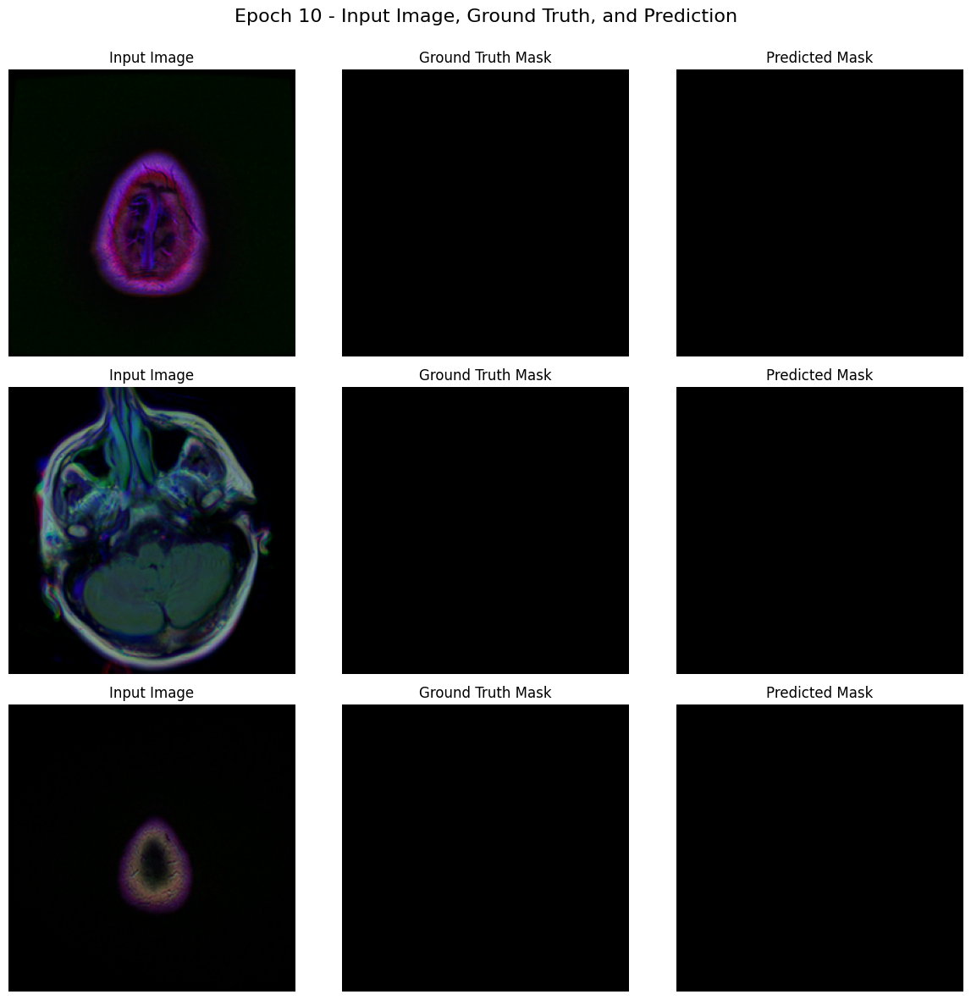

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 11/20, Train Loss: 0.0029, Val Loss: 0.0026, Dice Coefficient: 0.6035, IoU Score: 0.4955, Accuracy: 0.9599


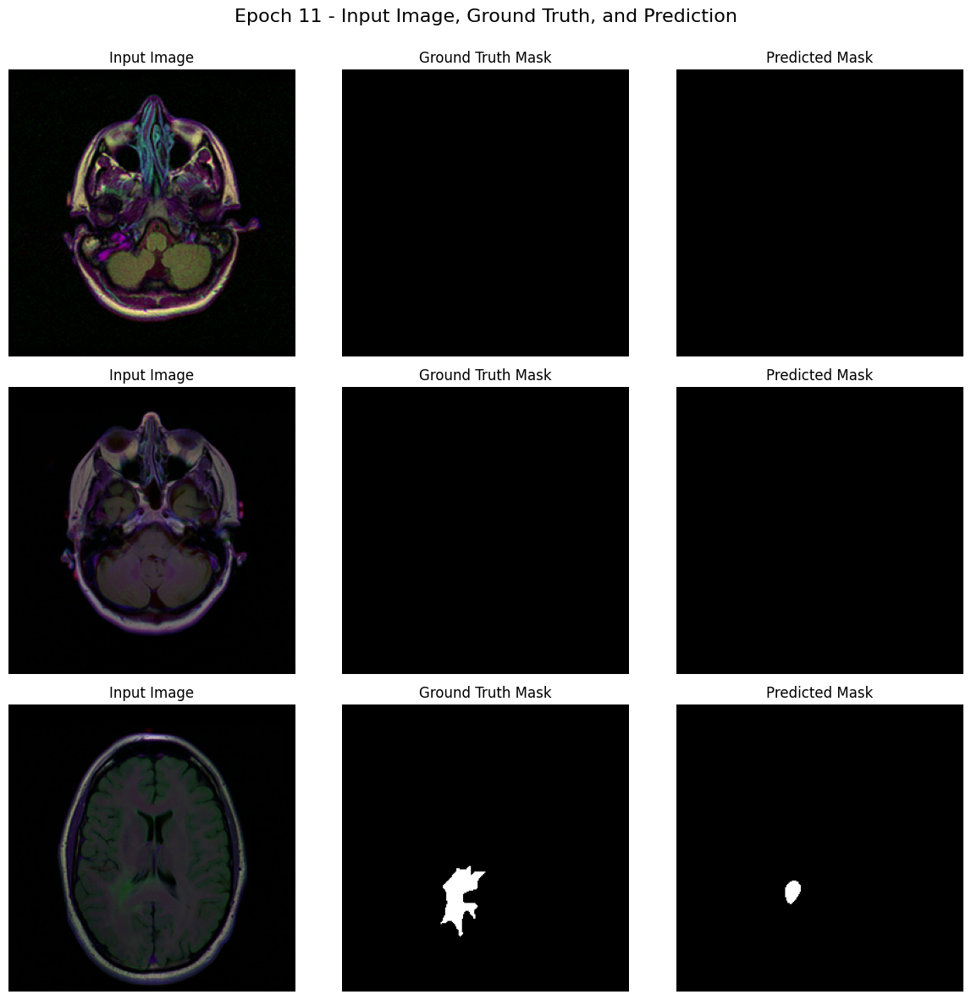

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 12/20, Train Loss: 0.0028, Val Loss: 0.0025, Dice Coefficient: 0.4970, IoU Score: 0.4015, Accuracy: 0.9562


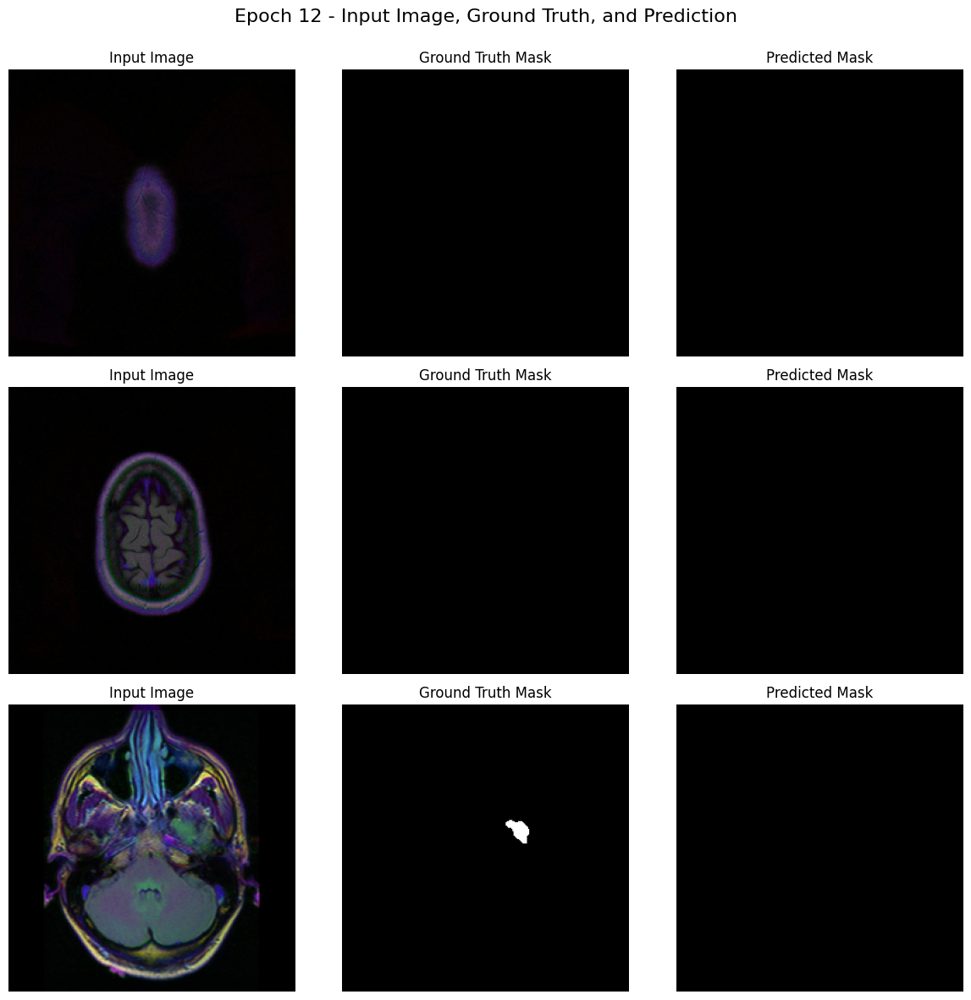

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 13/20, Train Loss: 0.0026, Val Loss: 0.0025, Dice Coefficient: 0.6405, IoU Score: 0.5261, Accuracy: 0.9588


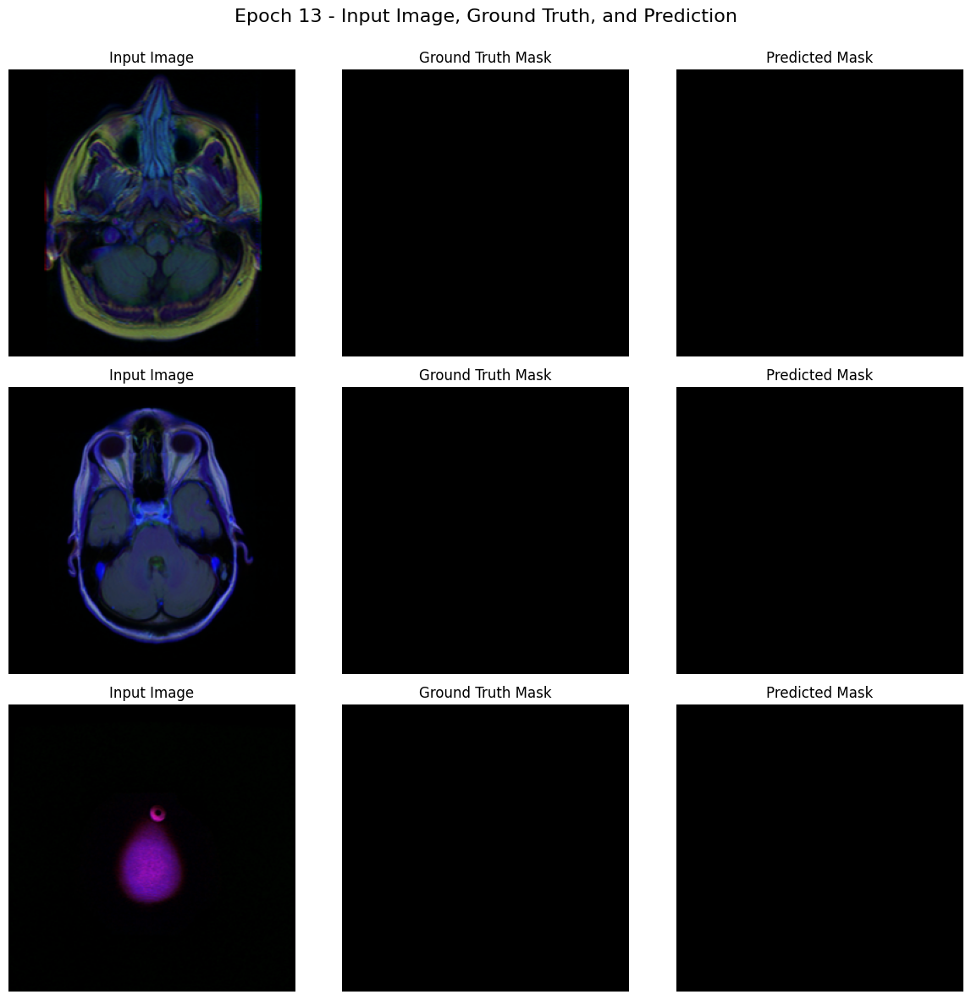

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 14/20, Train Loss: 0.0025, Val Loss: 0.0022, Dice Coefficient: 0.6703, IoU Score: 0.5604, Accuracy: 0.9622


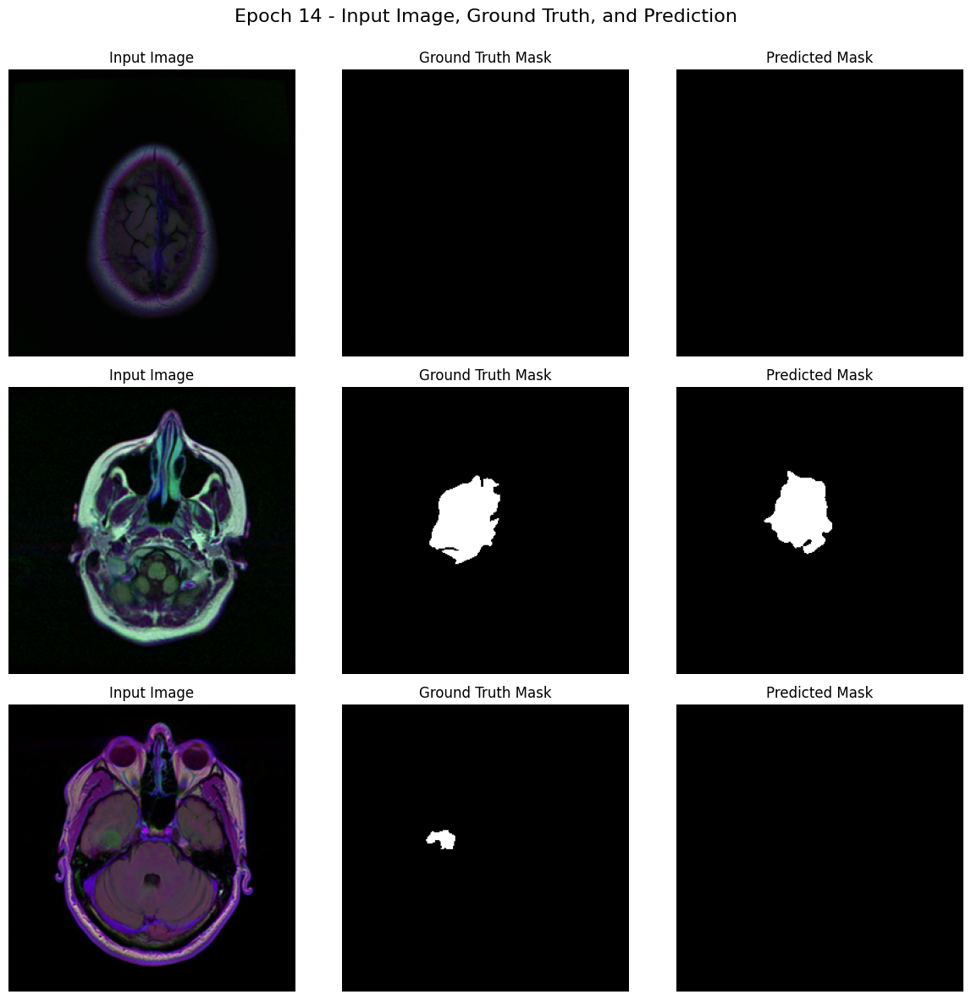

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 15/20, Train Loss: 0.0023, Val Loss: 0.0021, Dice Coefficient: 0.6812, IoU Score: 0.5668, Accuracy: 0.9572


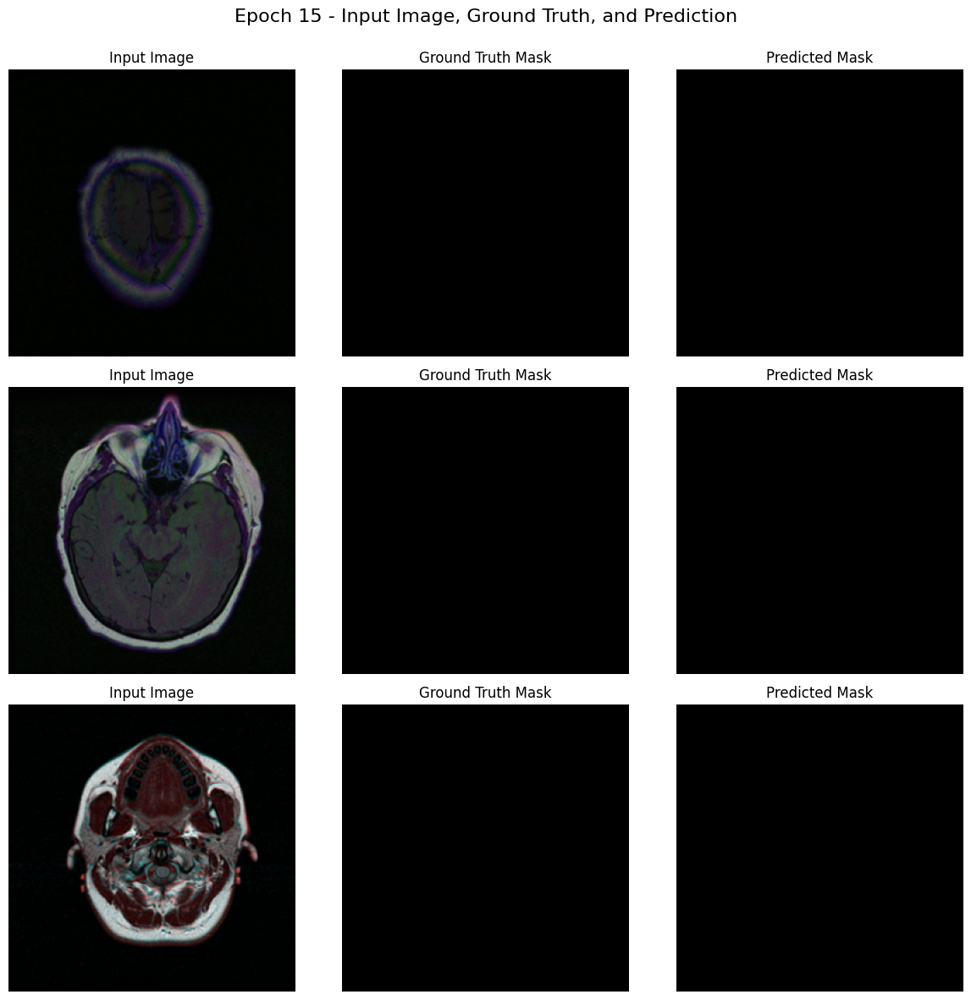

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 16/20, Train Loss: 0.0021, Val Loss: 0.0020, Dice Coefficient: 0.7355, IoU Score: 0.6224, Accuracy: 0.9600


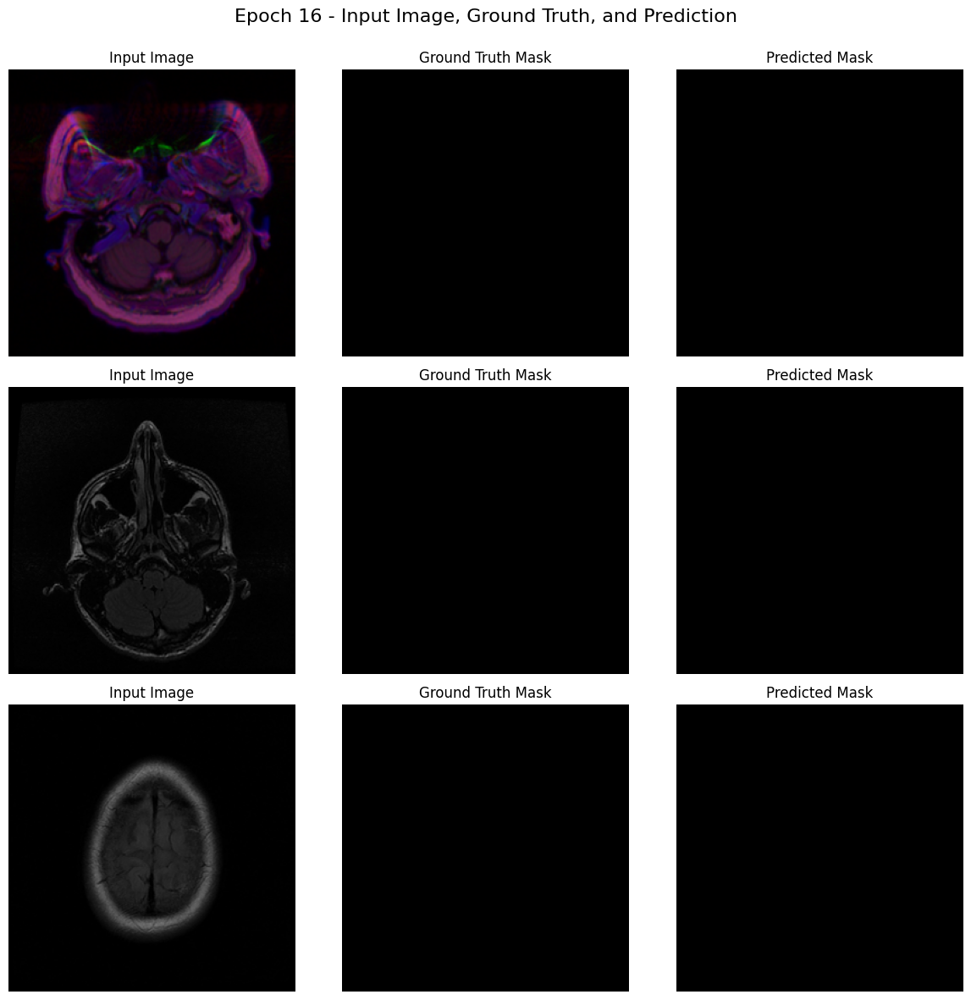

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 17/20, Train Loss: 0.0020, Val Loss: 0.0019, Dice Coefficient: 0.6886, IoU Score: 0.5761, Accuracy: 0.9543


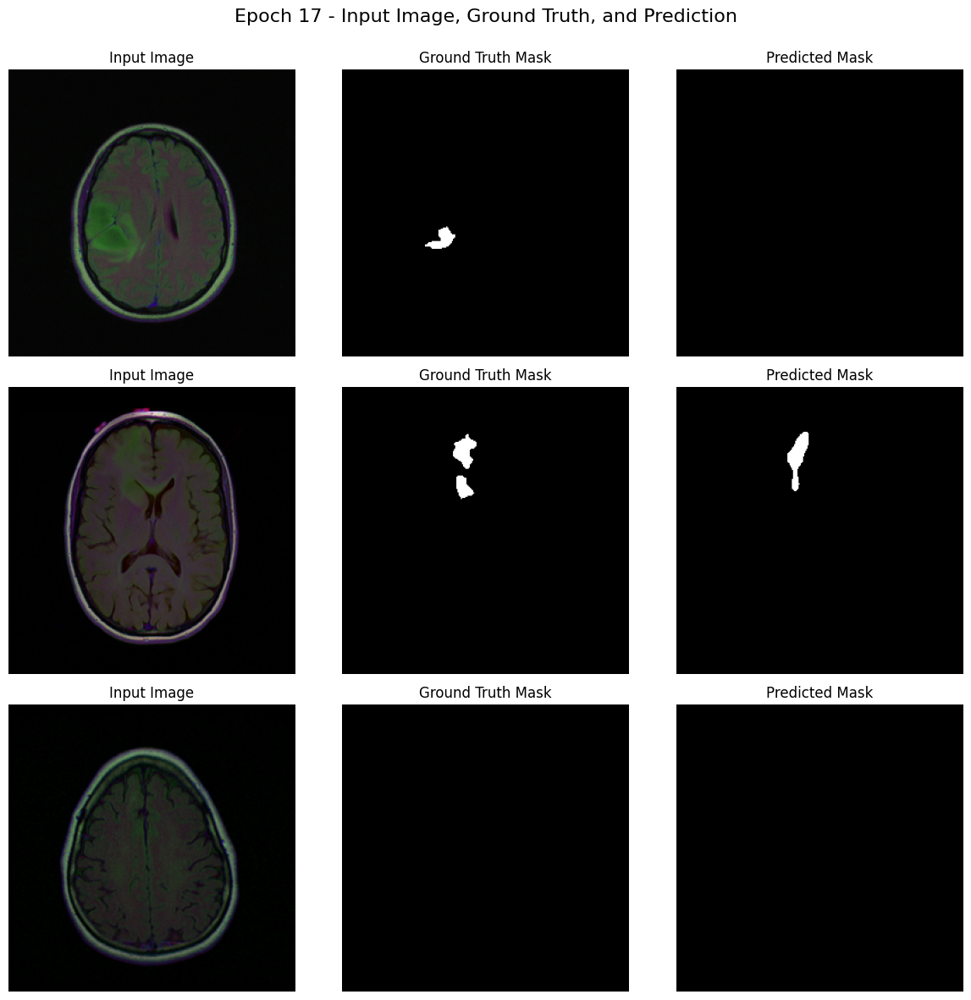

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 18/20, Train Loss: 0.0019, Val Loss: 0.0018, Dice Coefficient: 0.6846, IoU Score: 0.5728, Accuracy: 0.9523


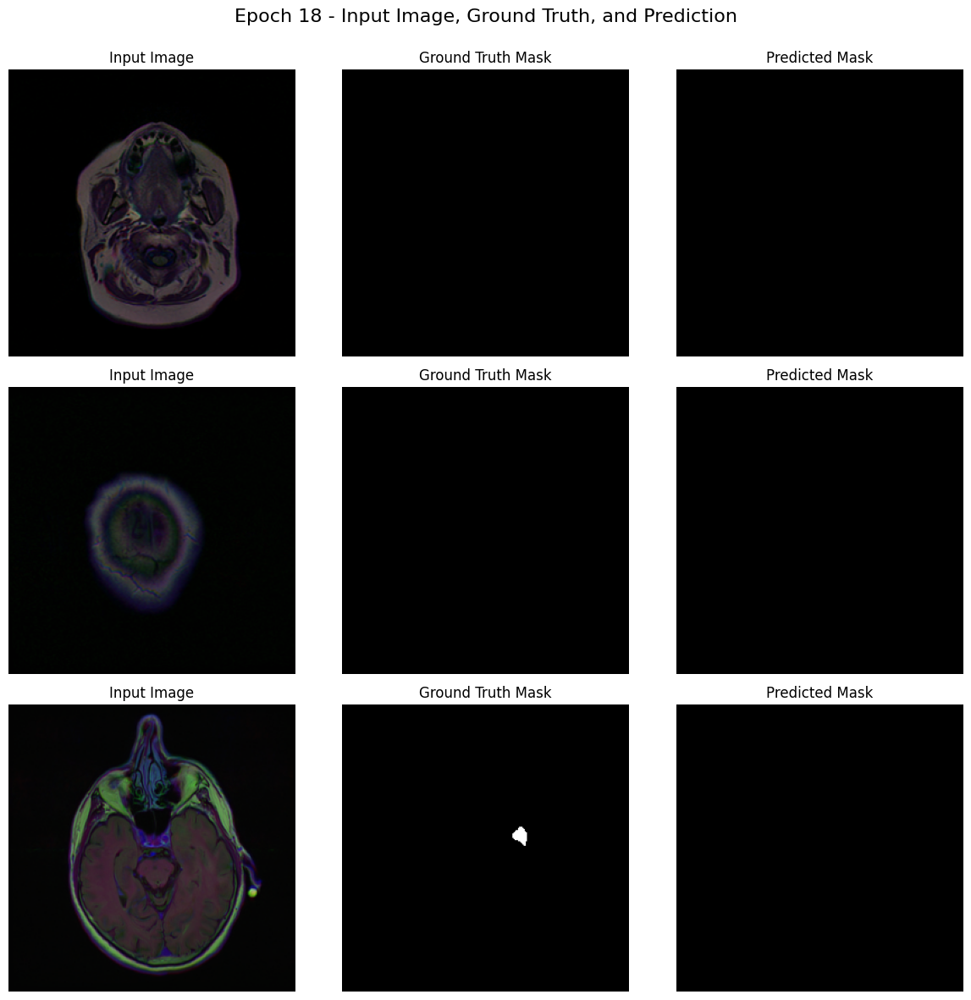

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 19/20, Train Loss: 0.0019, Val Loss: 0.0022, Dice Coefficient: 0.7864, IoU Score: 0.6809, Accuracy: 0.9562


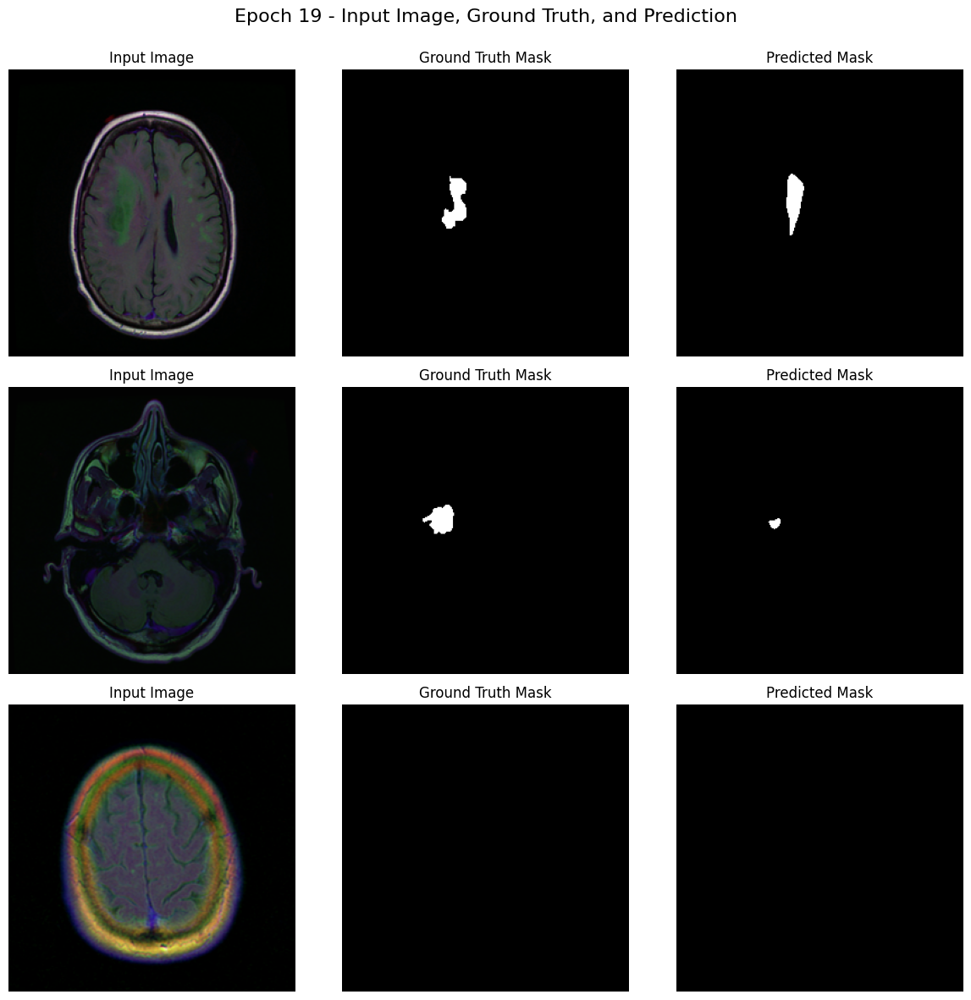

100%|██████████| 246/246 [01:41<00:00,  2.43it/s]


Epoch 20/20, Train Loss: 0.0019, Val Loss: 0.0022, Dice Coefficient: 0.7222, IoU Score: 0.6085, Accuracy: 0.9572


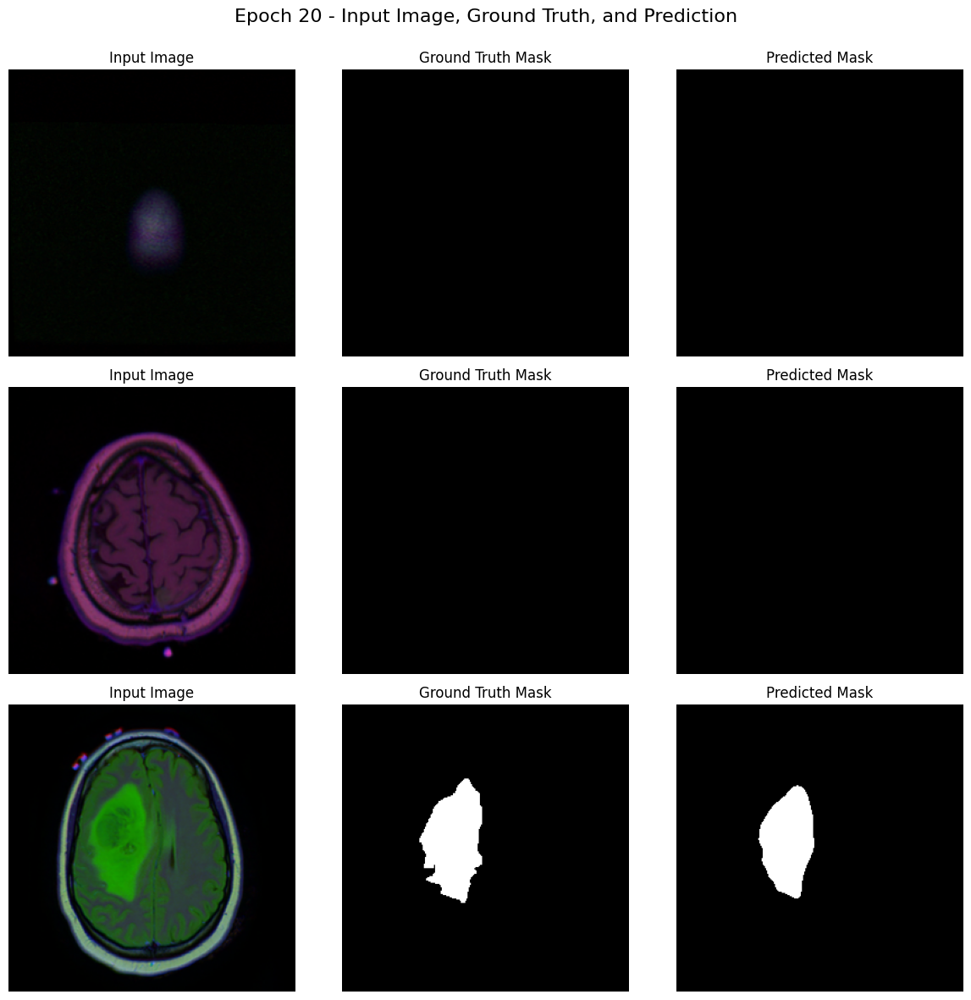

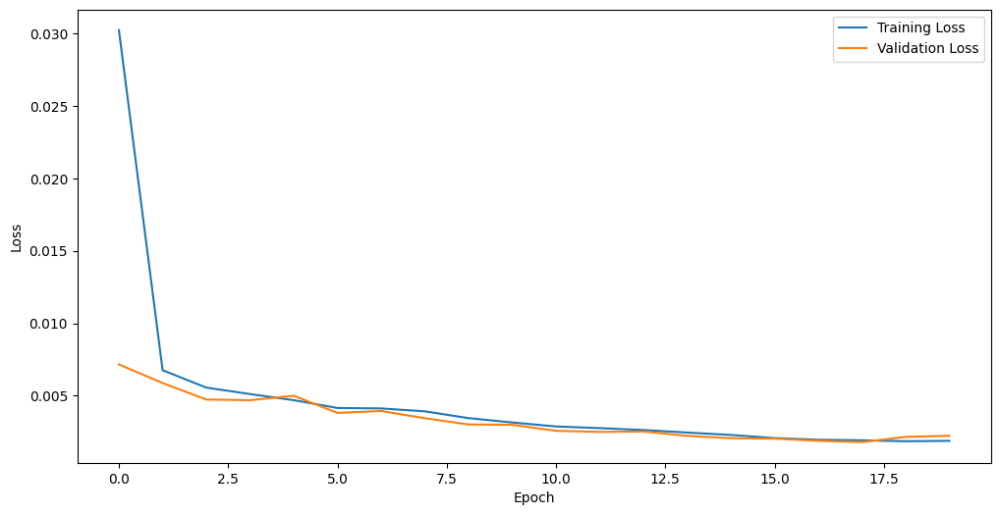

[(0.19368796166710897, 0.19368796166710897, 0.9569664244191827),
 (0.1936879616927831, 0.1936879616927831, 0.9559901997951431),
 (0.19778664552818706, 0.19582072954794644, 0.9538820984710049),
 (0.20801895374140023, 0.2016308438345646, 0.9553992236713381),
 (0.2791948452005511, 0.24563247231133198, 0.9553554862108082),
 (0.29956834050722264, 0.2587168047677607, 0.9500649855864446),
 (0.528874906604158, 0.42748362575530374, 0.9547381596457233),
 (0.6001412263263859, 0.4838593288520373, 0.9550933604872721),
 (0.5266274380009038, 0.4256068051606071, 0.9572986885317412),
 (0.3321402069401033, 0.27949309984183185, 0.9525569023507094),
 (0.6035420383408319, 0.4955093672997146, 0.9598689536825031),
 (0.49699931455193386, 0.4014554071498919, 0.9562346083907324),
 (0.6405296889572429, 0.5261338651032276, 0.9588413408434279),
 (0.6702822879532467, 0.5604262453395726, 0.96223038042068),
 (0.6812412210188132, 0.5668381486278661, 0.9572158778523877),
 (0.7354756978858825, 0.6223623863467105, 0.9599

In [15]:
from tqdm import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def train_model(model, train_loader, val_loader, optimizer, criterion, num_epochs=50):
    
    model.to(device)
    
    train_losses = []
    val_losses = []
    epoch_metrics = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for images, masks in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            # Forward pass
            outputs = model(images)
            outputs = F.interpolate(outputs, size=(masks.size(2), masks.size(3)), mode='bilinear', align_corners=False)
            
            loss = criterion(outputs, masks)
            
            # Backward pass and optimizer step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()

        # Average training loss
        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_iou = 0.0
        val_dice = 0.0
        val_accuracy = 0.0
        total_samples = 0
        
        all_images = []
        all_true_masks = []
        all_pred_masks = []

        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                
                # Forward pass
                outputs = model(images)
                outputs = F.interpolate(outputs, size=(masks.size(2), masks.size(3)), mode='bilinear', align_corners=False)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                
                # Calculate metrics
                dice = dice_coefficient(masks, outputs).item()
                iou = iou_score(masks, outputs).item()
                acc = ((outputs > 0.5) == masks).float().mean().item()
                
                val_dice += dice * images.size(0)
                val_iou += iou * images.size(0)
                val_accuracy += acc * images.size(0)
                total_samples += images.size(0)

                # Collect all samples for random selection
                all_images.extend(images)
                all_true_masks.extend(masks)
                all_pred_masks.extend((outputs > 0.5).float())

        # Average validation metrics
        avg_val_loss = val_loss / len(val_loader)
        avg_val_dice = val_dice / total_samples
        avg_val_iou = val_iou / total_samples
        avg_val_accuracy = val_accuracy / total_samples

        val_losses.append(avg_val_loss)
        epoch_metrics.append((avg_val_dice, avg_val_iou, avg_val_accuracy))

        # Print out training and validation progress
        print(f"Epoch {epoch+1}/{num_epochs}, "
              f"Train Loss: {avg_train_loss:.4f}, "
              f"Val Loss: {avg_val_loss:.4f}, "
              f"Dice Coefficient: {avg_val_dice:.4f}, "
              f"IoU Score: {avg_val_iou:.4f}, "
              f"Accuracy: {avg_val_accuracy:.4f}")
        
        # Randomly select 3 samples for visualization
        if len(all_images) >= 3:
            indices = random.sample(range(len(all_images)), 3)
            sample_images = [all_images[i] for i in indices]
            sample_true_masks = [all_true_masks[i] for i in indices]
            sample_pred_masks = [all_pred_masks[i] for i in indices]
            visualize_samples(sample_images, sample_true_masks, sample_pred_masks, epoch+1)

    # Plot training and validation losses
    plt.figure(figsize=(12, 6))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    return epoch_metrics




model = UNetVGG16(pretrained=True)
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = FocalLoss(alpha=1, gamma=2)

train_model(model, train_loader, val_loader, optimizer, criterion, num_epochs=20)

In [19]:
def evaluate_model_on_test_set(model, test_loader, criterion, device='cuda'):
    model.eval()
    
    total_loss = 0.0
    total_dice = 0.0
    total_iou = 0.0
    total_accuracy = 0.0
    total_samples = 0

    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            
            # Forward pass: get model predictions
            outputs = model(images)
            outputs = torch.sigmoid(outputs)  # Apply sigmoid to get probabilities
            outputs = F.interpolate(outputs, size=(masks.size(2), masks.size(3)), mode='bilinear', align_corners=False)
            preds = (outputs > 0.5).float()  # Convert probabilities to binary predictions

            # Compute loss
            loss = criterion(outputs, masks)
            total_loss += loss.item()
            
            # Compute metrics
            dice = dice_coefficient(masks, preds).item()
            iou = iou_score(masks, preds).item()
            acc = pixel_accuracy(masks, preds).item()

            total_dice += dice * images.size(0)
            total_iou += iou * images.size(0)
            total_accuracy += acc * images.size(0)
            total_samples += images.size(0)

    # Average metrics
    avg_loss = total_loss / len(test_loader)
    avg_dice = total_dice / total_samples
    avg_iou = total_iou / total_samples
    avg_accuracy = total_accuracy / total_samples

    # Print results
    print(f"Test Loss: {avg_loss:.4f}")
    print(f"Dice Score: {avg_dice:.4f}")
    print(f"IoU Score: {avg_iou:.4f}")
    print(f"Accuracy: {avg_accuracy:.4f}")

    return {
        "Test Loss": avg_loss,
        "Dice Score": avg_dice,
        "IoU Score": avg_iou,
        "Accuracy": avg_accuracy
    }

# Example usage (assuming the model, test_loader, and criterion are available):
metrics = evaluate_model_on_test_set(model, test_loader, criterion, device='cuda')


Test Loss: 0.1770
Dice Score: 0.7700
IoU Score: 0.6593
Accuracy: 0.9523


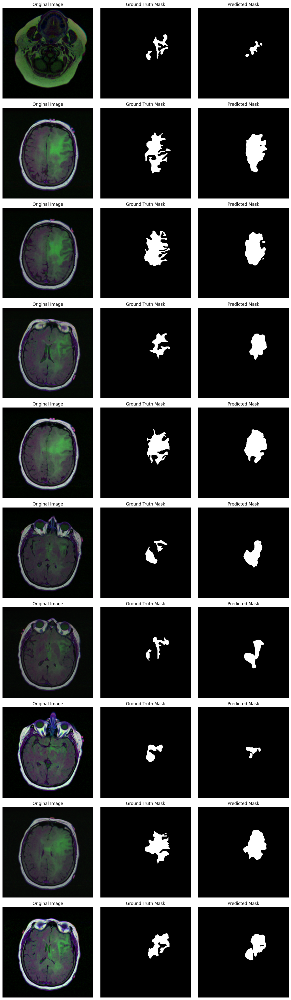

In [17]:
import torchvision.transforms.functional as TF

def visualize_test_images_with_tumor(test_loader, model, num_samples=10, device='cuda'):
    model.eval()
    selected_images = []
    selected_masks = []
    selected_preds = []

    # Iterate over the test_loader to find images with tumors
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            
            # Get model predictions
            outputs = model(images)
            outputs = torch.sigmoid(outputs)  # Apply sigmoid to get probabilities
            preds = (outputs > 0.5).float()  # Convert probabilities to binary predictions
            
            # Check for tumor presence (non-zero in the mask)
            for i in range(images.size(0)):
                if torch.sum(masks[i]) > 0:  # If the mask contains a tumor (non-zero pixels)
                    selected_images.append(images[i])
                    selected_masks.append(masks[i])
                    selected_preds.append(preds[i])
            
            # Stop if we've selected enough samples
            if len(selected_images) >= num_samples:
                break

    # Randomly select 10 images with tumors
    indices = random.sample(range(len(selected_images)), num_samples)
    
    # Plot the selected images, masks, and predictions
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))
    for i, idx in enumerate(indices):
        image = selected_images[idx]
        true_mask = selected_masks[idx]
        pred_mask = selected_preds[idx]
        
        # Convert tensors to PIL images for visualization
        image_pil = TF.to_pil_image(image.cpu())
        true_mask_pil = TF.to_pil_image(true_mask.cpu())
        pred_mask_pil = TF.to_pil_image(pred_mask.cpu())
        
        # Plot original image
        axes[i, 0].imshow(image_pil, cmap='gray')
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis('off')

        # Plot ground truth mask
        axes[i, 1].imshow(true_mask_pil, cmap='gray')
        axes[i, 1].set_title("Ground Truth Mask")
        axes[i, 1].axis('off')

        # Plot predicted mask
        axes[i, 2].imshow(pred_mask_pil, cmap='gray')
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage (assuming model is loaded, and test_loader is available):
visualize_test_images_with_tumor(test_loader, model, num_samples=10, device='cuda')
